# Segmentation of Retinal Cysts in OCT Images
Image Processing (CSC8628)
<br>
<br>
Fauzi .
<br>
250286733
<br>
11/11/2025

## 1. K-means Segmentation 

### - Library

In [32]:
# import libraries
import os
import cv2
import time
import statistics
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, accuracy_score, precision_score, recall_score, f1_score

### - Directory

In [33]:
# define the directory
img_dir = "data/OCT_Dataset/img_dir"
gt_dir = "data/OCT_Dataset/ann_dir"

# create list dir
list_dir = os.listdir(img_dir)
#print(list_dir)

### - Dictionary

In [34]:
### make dictionary ###
img_dict = {}   # original
gt_dict = {}    # ground truth

# Preprocessing dict
morph_filt_dict = {}
median_filt_dict = {}

# RoI dict
bottom_roi_dict = {}
ab_cont_dict = {}
top_roi_dict = {}
combined_roi_dict = {}
roi_median_dict = {}
roi_morph_dict = {}
final_roi_dict = {}

# Cysts Processing dist

cyst_mask_dict = {}

cyst_cont_dict = {}
cyst_hs_dict = {}
cyst_kmeans_dict = {}
cyst_kmeans_dark_dict = {}
pred_raw_dict = {}
pred_morph_dict = {}
final_pred_dict = {}

# Time dict
start_time = {}
end_time = {}
proc_time = {}

### - Kmeans Segmentation (Main Script) 

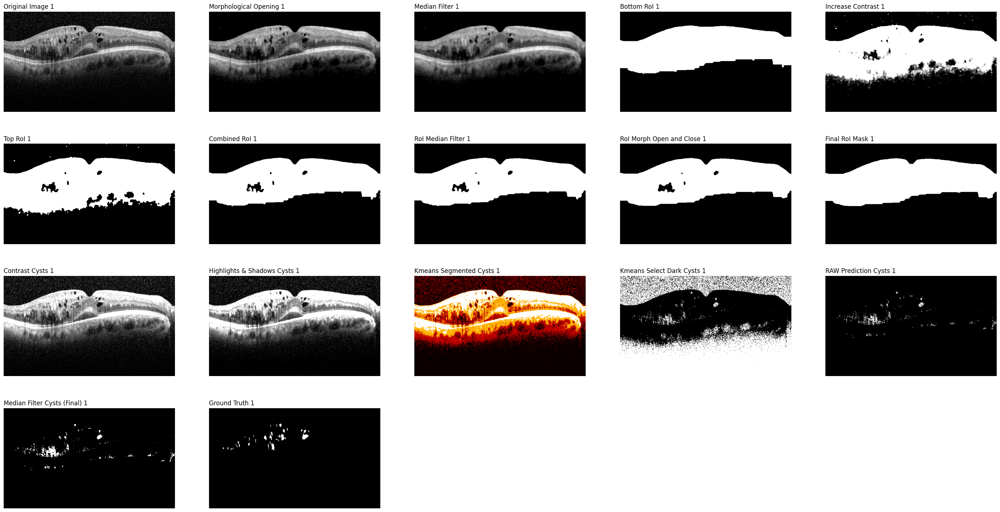

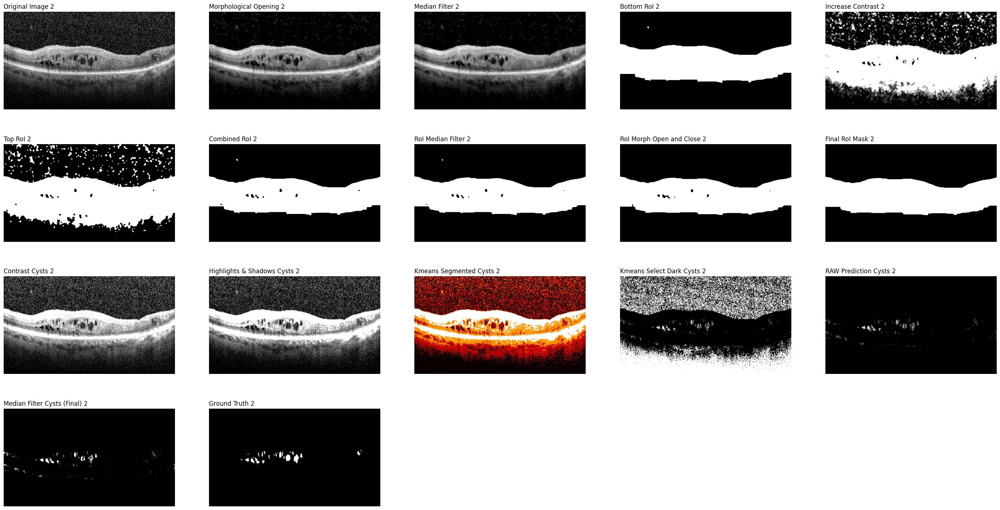

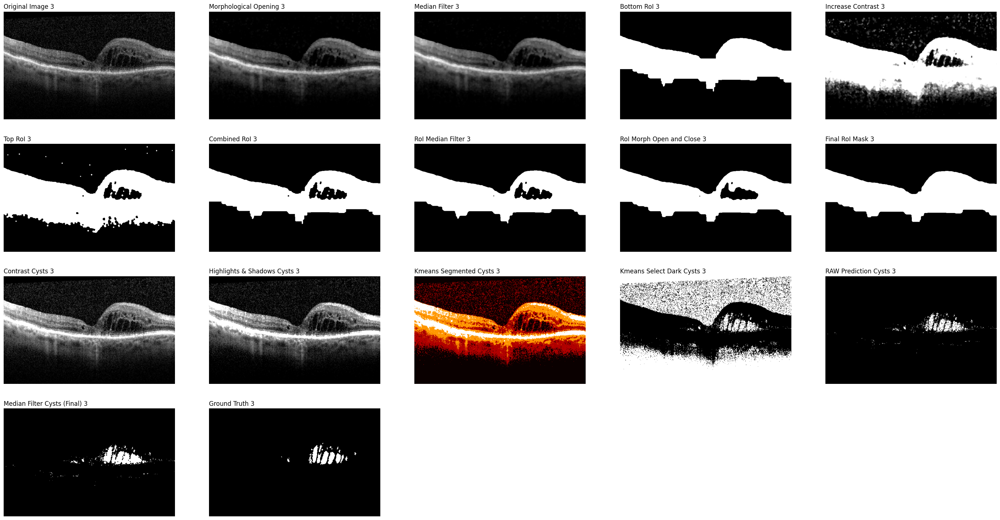

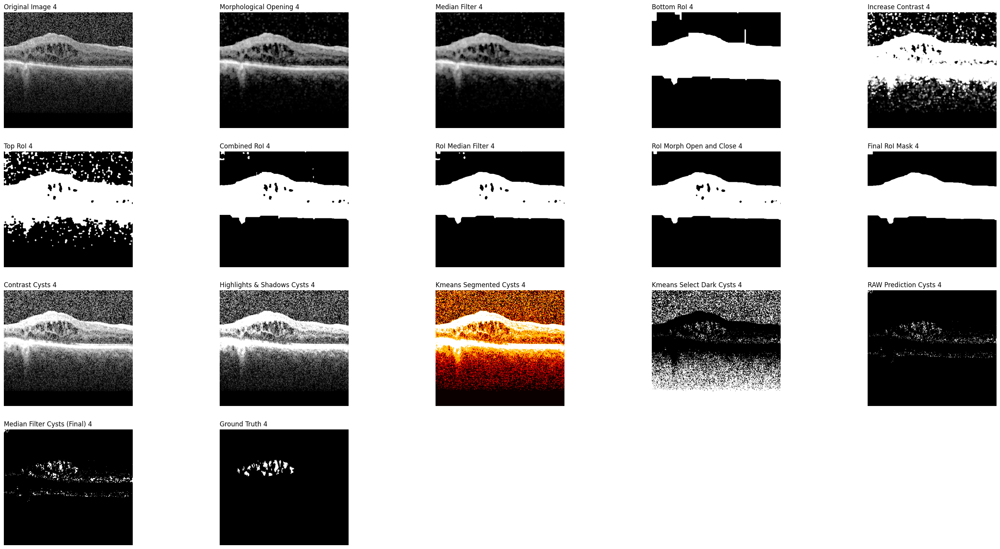

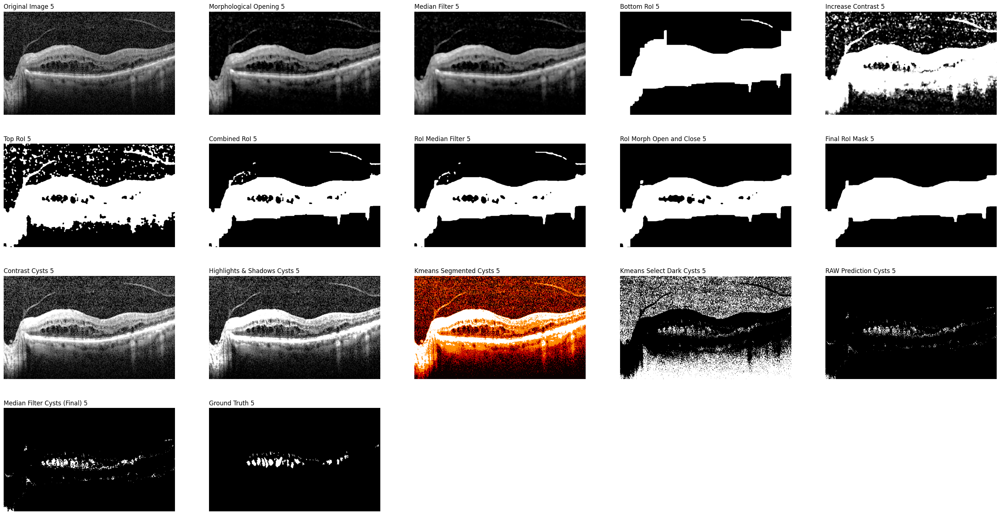

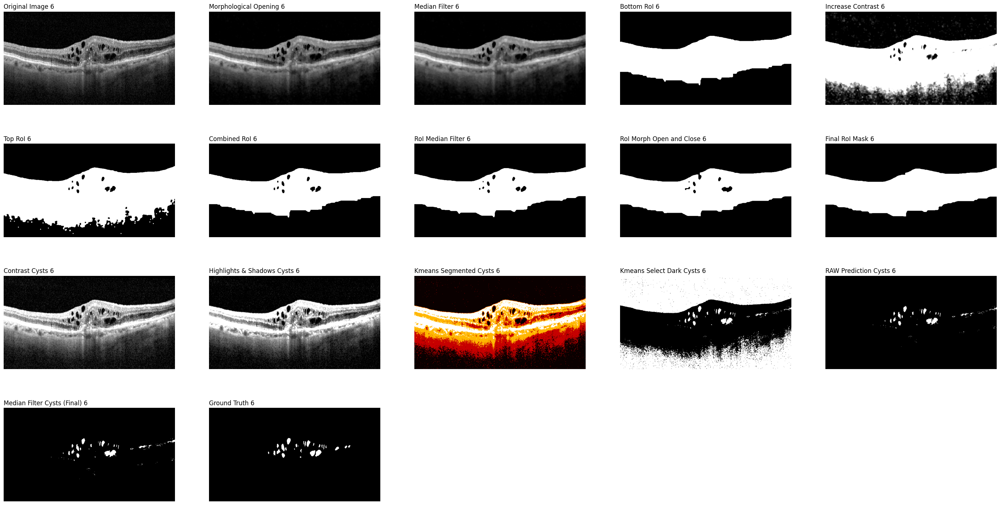

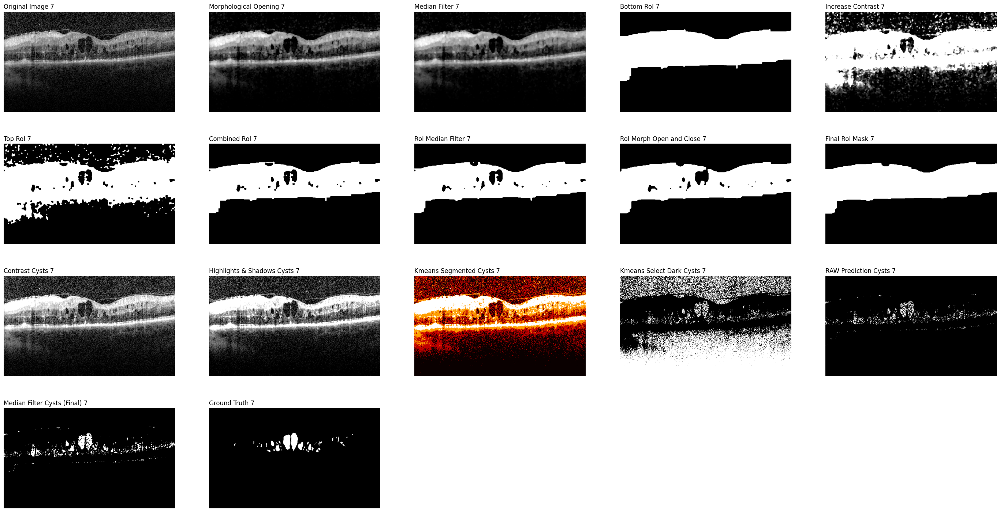

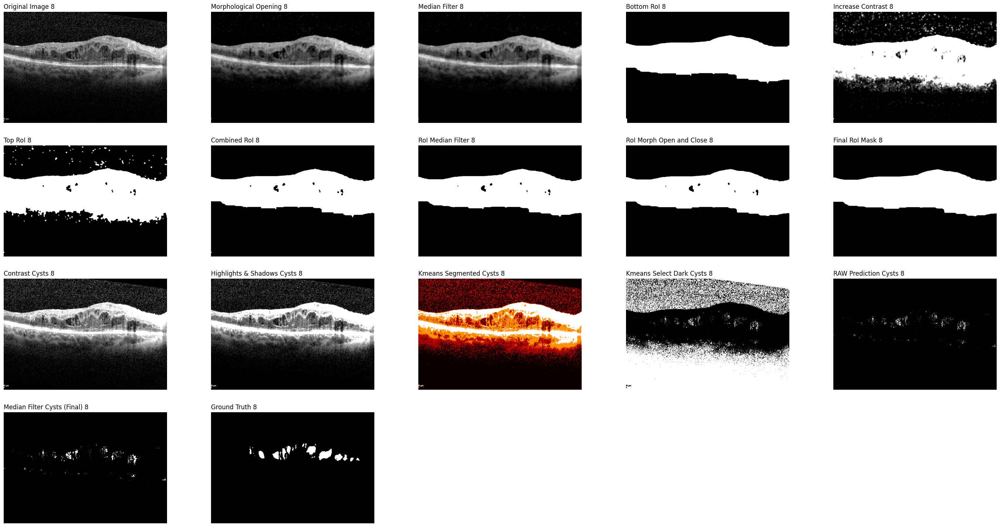

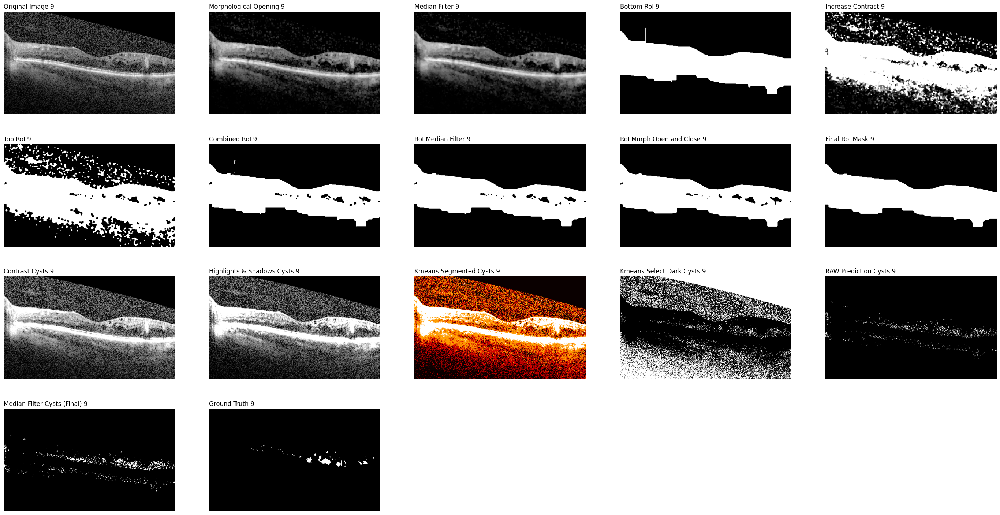

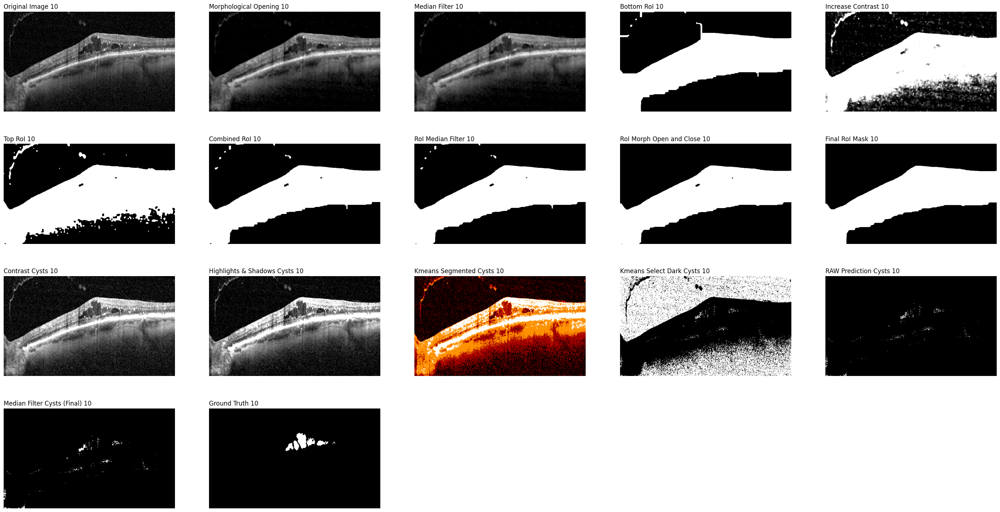

In [35]:
# initial input for key
key = int(1)

for img_filename in list_dir:
    # get start time
    start_time[key]= time.time()

    # create full path
    img_path = img_dir + "/" + img_filename
    gt_path = gt_dir + "/" + img_filename

    #################################################################################
    ## Import Original Image and Ground Truth
    # load the grayscale image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)    # OCT scans
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)      # Ground truth

    #trim left and right
    img = img[:, 20:-20]
    gt = gt[:, 20:-20]

    # save to dict
    img_dict[key] = img
    gt_dict[key] = gt

    #################################################################################

    ## CREATE REGION OF INTEREST
    ## Preprocessing ##
    
    ## Apply Morphological Opening (Filter)
    # define a kernel
    kernel = np.ones((5, 5), np.uint8)

    # apply morphological opening
    morph_filt_dict[key] = cv2.morphologyEx(img_dict[key], cv2.MORPH_OPEN, kernel)
    
    ## Apply Median Filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 5

    # apply median filter
    median_filt_dict[key] = cv2.medianBlur(morph_filt_dict[key], MEDIAN_BLUR_KERNEL)  


    ## Bottom RoI ##

    ## Apply Otsu's Method 
    # set kernel size
    CLOSE_KERNEL_SIZE = 60

    _ , retina_mask_holey = cv2.threshold(median_filt_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    bottom_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Top RoI ##

    ## Apply Contrast (increase)
    # set alpha and beta
    alpha = 10  # contrast
    beta = 0    # brightness

    # adjust contrast
    ab_cont_dict[key] = cv2.convertScaleAbs(median_filt_dict[key], alpha=alpha, beta=beta)

    ## Apply Otsu's Method (threshold)
    # set kernel size
    CLOSE_KERNEL_SIZE = 5

    _ , retina_mask_holey = cv2.threshold(ab_cont_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    top_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Combine Mask (Top + Bottom RoI) ##

    ## Bitwise AND (keep white)
    # apply pixel-wise AND
    combined_roi_dict[key] = cv2.bitwise_and(top_roi_dict[key], bottom_roi_dict[key])

    ## Median filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 7

    # apply median filter
    roi_median_dict[key] = cv2.medianBlur(combined_roi_dict[key], MEDIAN_BLUR_KERNEL)

    ## Morphological Opening and Closing
    # Filling small holes in bright regions 
    # Connecting nearby bright regions
    # define a kernel
    kernel_open = np.ones((10,10), np.uint8)
    kernel_close = np.ones((50,15), np.uint8)

    # apply morphological opening
    roi_morph_dict[key] = cv2.morphologyEx(roi_median_dict[key], cv2.MORPH_OPEN, kernel_open)

    # apply morphological closing
    final_roi_dict[key] = cv2.morphologyEx(roi_morph_dict[key], cv2.MORPH_CLOSE, kernel_close)

    #################################################################################

    ## CYSTS PROCESSING 
    ## Preprocessing ##

    ## Adjust Contrast
    # set alpha and beta
    alpha = 1.5 # contrast
    beta = 0    # brightness

    cyst_cont_dict[key] = cv2.convertScaleAbs(img_dict[key], alpha=alpha, beta=beta)


    ## Highlights and Shadows
    # set values for highlight and shadows
    shadows_val = -10   # (-) increase shadows
    highlights_val = 75 # (+) increase highlights

    # to float
    img_float = cyst_cont_dict[key].astype("float32")

    # adjust shadows
    shadow_map = np.clip((100 - img_float) / 100, 0, 1) # map for shadows
    img_float = img_float + shadow_map * shadows_val

    # adjust highlights
    highlight_map = np.clip((img_float - 150) / 105, 0, 1) # 105 = 255 - 150 map for highlights
    img_float = img_float + highlight_map * highlights_val

    # set pixel values 0-255
    cyst_hs_dict[key] = np.clip(img_float, 0, 255).astype("uint8")


    ## Kmeans Clustering Segmentation
    # reshape the image to a 2D array of pixels and convert to float32
    pixel_values = cyst_cont_dict[key].reshape((-1, 1))
    pixel_values = np.float32(pixel_values)

    # defining Parameters
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
    K = 4
    attempts=10

    flags = cv2.KMEANS_RANDOM_CENTERS #saves computation Time
    #flags = cv2.KMEANS_PP_CENTERS #more onsistent results, but slower

    # applying K-Means for Image Segmentation
    compactness, labels, centers = cv2.kmeans(pixel_values, K, None, criteria, attempts, flags)
    centers = np.uint8(centers)
    # map each pixel label to its cluster center value
    segmented_data = centers[labels.flatten()]
    # reshape the 1D array back to a 2D image (height x width)
    segmented_image = segmented_data.reshape(cyst_hs_dict[key].shape)

    # select the darkest cluster (cyst)
    # 1. Find the label for the darkest cluster ("black")
    darkest_label = np.argmin(centers)
    # 2. Reshape 'labels' (which contains 0, 1, 2) back to the shape of the image
    im_labels = labels.reshape(cyst_hs_dict[key].shape)
    # 3. Create a binary image where pixels with the darkest label are set to 255 (white) and others to 0 (black)
    cyst_dark = np.where(im_labels == darkest_label, 255, 0).astype(np.uint8)

    # save to dict
    cyst_kmeans_dict[key] = segmented_image  #suitable for visualizing clusters
    cyst_kmeans_dark_dict[key] = cyst_dark   #binary mask of darkest cluster


    ## Eliminate NON-Cyst using Bitwise AND
    # Keep the 255/white in Cyst and remove Top & Bottom white  
    # Apply pixel-wise AND
    pred_raw_dict[key] = cv2.bitwise_and(final_roi_dict[key], cyst_kmeans_dark_dict[key])

    #################################################################################

    ## POST PROCESSING
    ## morphological operation close
    # define a kernel
    kernel = np.ones((3, 3), np.uint8)

    # apply morphological closing
    pred_morph_dict[key] = cv2.morphologyEx(pred_raw_dict[key], cv2.MORPH_CLOSE, kernel)

    # save to final dict
    final_pred_dict[key] = pred_morph_dict[key]

    #################################################################################
    
    # get end time
    end_time[key] = time.time()

    # processing Time
    proc_time[key] = end_time[key] - start_time[key]

    #################################################################################
    
    ## PLOTTING
    plt.figure(figsize=(35, 18)) # width, height (1 map = 11 height)

    plt.subplot(4, 5, 1)
    plt.title("Original Image " + str(key), loc='left')
    plt.imshow(img_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 2)
    plt.title("Morphological Opening " + str(key), loc='left')
    plt.imshow(morph_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 3)
    plt.title("Median Filter " + str(key), loc='left')
    plt.imshow(median_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 4)
    plt.title("Bottom RoI " + str(key), loc='left')
    plt.imshow(bottom_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 5)
    plt.title("Increase Contrast " + str(key), loc='left')
    plt.imshow(ab_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 6)
    plt.title("Top RoI " + str(key), loc='left')
    plt.imshow(top_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 7)
    plt.title("Combined RoI " + str(key), loc='left')
    plt.imshow(combined_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 8)
    plt.title("RoI Median Filter " + str(key), loc='left')
    plt.imshow(roi_median_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 9)
    plt.title("RoI Morph Open and Close " + str(key), loc='left')
    plt.imshow(roi_morph_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 10)
    plt.title("Final RoI Mask " + str(key), loc='left')
    plt.imshow(final_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 11)
    plt.title("Contrast Cysts " + str(key), loc='left')
    plt.imshow(cyst_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 12)
    plt.title("Highlights & Shadows Cysts " + str(key), loc='left')
    plt.imshow(cyst_hs_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 13)
    plt.title("Kmeans Segmented Cysts " + str(key), loc='left')
    plt.imshow(cyst_kmeans_dict[key], cmap='hot')
    plt.axis('off')

    plt.subplot(4, 5, 14)
    plt.title("Kmeans Select Dark Cysts " + str(key), loc='left')
    plt.imshow(cyst_kmeans_dark_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 15)
    plt.title("RAW Prediction Cysts " + str(key), loc='left')
    plt.imshow(pred_raw_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 16)
    plt.title("Median Filter Cysts (Final) " + str(key), loc='left')
    plt.imshow(final_pred_dict[key], cmap='gray')
    plt.axis('off') 

    plt.subplot(4, 5, 17)
    plt.title("Ground Truth " + str(key), loc='left')
    plt.imshow(gt_dict[key], cmap='gray')
    plt.axis('off') 

    key += 1



### Evaluation Metrics for K-means

In [36]:
# evaluation score dictionary
miou_dict = {}
accuracy_dict = {}
precision_dict = {}
recall_dict = {}
f1_dice_dict = {}

# process evaluation metrics
for key in img_dict:
    # flatten and normalize images (0-255 -> 0 or 1)
    gt_flat = (gt_dict[key].flatten()) / 255
    final_pred_flat = (final_pred_dict[key].flatten()) / 255

    # mIoU score
    miou_score = jaccard_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    miou_dict[key] = miou_score

    # pixel Accuracy
    accuracy = accuracy_score(gt_flat, final_pred_flat)
    accuracy_dict[key] = accuracy

    # precision
    precision = precision_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    precision_dict[key] = precision

    # recall (sensitivity)
    recall = recall_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    recall_dict[key] = recall

    # F1-Score (Dice Coefficient)
    f1 = f1_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    f1_dice_dict[key] = f1

# print summary table
print("\n==== Evaluation Metrics Table ====")

sorted_keys = sorted(miou_dict.keys())

# create header
header = "Metric         |"
for key in sorted_keys:
    header += f" Image {key:<2} |"
print(header)
print("-" * len(header))

# define metrics and print rows
metrics_to_print = [
    ("Proc Time ", proc_time),
    ("mIoU Score ", miou_dict),
    ("Accuracy", accuracy_dict),
    ("Precision", precision_dict),
    ("Recall", recall_dict),
    ("F1 Score", f1_dice_dict)]

for metric_name, metric_dict in metrics_to_print:
    row_str = f"{metric_name:<14} |"
    for key in sorted_keys:
        row_str += f" {metric_dict[key]:<8.3f} |"
    print(row_str)

# function to calculate and print average/std dev
def print_metric_stats(metric_name, score_dict):
    """Calculates and prints the average and standard deviation for a metric."""
    avg = sum(score_dict.values()) / len(score_dict)
    
    # calculate standard deviation
    std_dev = statistics.stdev(score_dict.values())
        
    print(f"{metric_name}:")
    print(f"  Average: {avg:.3f}")
    print(f"  Std Dev: {std_dev:.3f}")

print("\n===== Overall Average Metrics =====")
print_metric_stats("Processing Time", proc_time)
print_metric_stats("mIoU Score", miou_dict)
print_metric_stats("Accuracy", accuracy_dict)
print_metric_stats("Precision", precision_dict)
print_metric_stats("Recall (Sensitivity)", recall_dict)
print_metric_stats("F1 Score (Dice)", f1_dice_dict)
print("===================================")


==== Evaluation Metrics Table ====
Metric         | Image 1  | Image 2  | Image 3  | Image 4  | Image 5  | Image 6  | Image 7  | Image 8  | Image 9  | Image 10 |
------------------------------------------------------------------------------------------------------------------------------
Proc Time      | 0.139    | 0.139    | 0.127    | 0.094    | 0.128    | 0.123    | 0.123    | 0.142    | 0.130    | 0.140    |
mIoU Score     | 0.165    | 0.429    | 0.632    | 0.264    | 0.436    | 0.638    | 0.397    | 0.197    | 0.193    | 0.110    |
Accuracy       | 0.985    | 0.994    | 0.991    | 0.982    | 0.986    | 0.995    | 0.980    | 0.983    | 0.983    | 0.984    |
Precision      | 0.220    | 0.701    | 0.665    | 0.357    | 0.536    | 0.814    | 0.477    | 0.702    | 0.230    | 0.394    |
Recall         | 0.397    | 0.526    | 0.927    | 0.502    | 0.701    | 0.747    | 0.703    | 0.216    | 0.543    | 0.132    |
F1 Score       | 0.283    | 0.601    | 0.775    | 0.417    | 0.607    | 0.7

## 2. Manual Threshold (Comparison)

### - Dictionary

In [37]:
### make dictionary ###
img_dict = {}   # original
gt_dict = {}    # ground truth

# Preprocessing dict
morph_filt_dict = {}
median_filt_dict = {}

# RoI dict
bottom_roi_dict = {}
ab_cont_dict = {}
top_roi_dict = {}
combined_roi_dict = {}
roi_median_dict = {}
roi_morph_dict = {}
final_roi_dict = {}

# Cysts Processing dist

cyst_mask_dict = {}
cyst_cont_dict = {}
cyst_hs_dict = {}
cyst_binInv_dict = {}
pred_raw_dict = {}
pred_median_dict = {}
final_pred_dict = {}

# Time dict
start_time = {}
end_time = {}
proc_time = {}

### - Manual Threshold (Main Script)

In [ ]:
# initial input for key
key = int(1)

for img_filename in list_dir:
    # get start time
    start_time[key]= time.time()

    # create full path
    img_path = img_dir + "/" + img_filename
    gt_path = gt_dir + "/" + img_filename

    #################################################################################
    ## Import Original Image and Ground Truth
    # load the grayscale image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)    # OCT scans
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)      # Ground truth

    #trim left and right
    img = img[:, 20:-20]
    gt = gt[:, 20:-20]

    # save to dict
    img_dict[key] = img
    gt_dict[key] = gt

    #################################################################################

    ## CREATE REGION OF INTEREST
    ## Preprocessing ##
    
    ## Apply Morphological Opening (Filter)
    # define a kernel
    kernel = np.ones((5, 5), np.uint8)

    # apply morphological opening
    morph_filt_dict[key] = cv2.morphologyEx(img_dict[key], cv2.MORPH_OPEN, kernel)
    
    ## Apply Median Filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 5

    # apply median filter
    median_filt_dict[key] = cv2.medianBlur(morph_filt_dict[key], MEDIAN_BLUR_KERNEL)  


    ## Bottom RoI ##

    ## Apply Otsu's Method 
    # set kernel size
    CLOSE_KERNEL_SIZE = 60

    _ , retina_mask_holey = cv2.threshold(median_filt_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    bottom_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Top RoI ##

    ## Apply Contrast (increase)
    # set alpha and beta
    alpha = 10  # contrast
    beta = 0    # brightness

    # adjust contrast
    ab_cont_dict[key] = cv2.convertScaleAbs(median_filt_dict[key], alpha=alpha, beta=beta)

    ## Apply Otsu's Method (threshold)
    # set kernel size
    CLOSE_KERNEL_SIZE = 5

    _ , retina_mask_holey = cv2.threshold(ab_cont_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    top_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Combine Mask (Top + Bottom RoI) ##

    ## Bitwise AND (keep white)
    # apply pixel-wise AND
    combined_roi_dict[key] = cv2.bitwise_and(top_roi_dict[key], bottom_roi_dict[key])

    ## Median filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 7

    # apply median filter
    roi_median_dict[key] = cv2.medianBlur(combined_roi_dict[key], MEDIAN_BLUR_KERNEL)

    ## Morphological Opening and Closing
    # Filling small holes in bright regions 
    # Connecting nearby bright regions
    # define a kernel
    kernel_open = np.ones((10,10), np.uint8)
    kernel_close = np.ones((50,15), np.uint8)

    # apply morphological opening
    roi_morph_dict[key] = cv2.morphologyEx(roi_median_dict[key], cv2.MORPH_OPEN, kernel_open)

    # apply morphological closing
    final_roi_dict[key] = cv2.morphologyEx(roi_morph_dict[key], cv2.MORPH_CLOSE, kernel_close)

    #################################################################################

    ## CYSTS PROCESSING 
    ## Preprocessing ##

    ## Adjust Contrast
    # set alpha and beta
    alpha = 1.5 # contrast
    beta = 0    # brightness

    cyst_cont_dict[key] = cv2.convertScaleAbs(img_dict[key], alpha=alpha, beta=beta)

    ## Highlights and Shadows
    # set values for highlight and shadows
    shadows_val = -10   # (-) increase shadows
    highlights_val = 75 # (+) increase highlights

    # to float
    img_float = cyst_cont_dict[key].astype("float32")

    # adjust shadows
    shadow_map = np.clip((100 - img_float) / 100, 0, 1) # map for shadows
    img_float = img_float + shadow_map * shadows_val

    # adjust highlights
    highlight_map = np.clip((img_float - 150) / 105, 0, 1) # 105 = 255 - 150 map for highlights
    img_float = img_float + highlight_map * highlights_val

    # set pixel values 0-255
    cyst_hs_dict[key] = np.clip(img_float, 0, 255).astype("uint8")

    ## Binary Threshold Invert Segmentation 
    # set threshold value
    MANUAL_THRESHOLD_VALUE = 60

    # apply inverse binary
    _ , cyst_binInv_dict[key] = cv2.threshold(cyst_hs_dict[key], MANUAL_THRESHOLD_VALUE, 255, cv2.THRESH_BINARY_INV)

    ## Eliminate NON-Cyst using Bitwise AND
    # Keep the 255/white in Cyst and remove Top & Bottom white  
    # Apply pixel-wise AND
    pred_raw_dict[key] = cv2.bitwise_and(final_roi_dict[key], cyst_binInv_dict[key])

    #################################################################################

    ## POST PROCESSING
    ## Morphological Closing
    # define a kernel
    kernel = np.ones((3, 3), np.uint8)

    # apply morphological closing
    final_pred_dict[key] = cv2.morphologyEx(pred_raw_dict[key], cv2.MORPH_CLOSE, kernel)

    #################################################################################
    
    # get end time
    end_time[key] = time.time()

    # processing Time
    proc_time[key] = end_time[key] - start_time[key]

    #################################################################################
    
    ## PLOTTING
    plt.figure(figsize=(35, 18)) # width, height (1 map = 11 height)

    plt.subplot(4, 5, 1)
    plt.title("Original Image " + str(key), loc='left')
    plt.imshow(img_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 2)
    plt.title("Morphological Opening " + str(key), loc='left')
    plt.imshow(morph_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 3)
    plt.title("Median Filter " + str(key), loc='left')
    plt.imshow(median_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 4)
    plt.title("Bottom RoI " + str(key), loc='left')
    plt.imshow(bottom_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 5)
    plt.title("Increase Contrast " + str(key), loc='left')
    plt.imshow(ab_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 6)
    plt.title("Top RoI " + str(key), loc='left')
    plt.imshow(top_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 7)
    plt.title("Combined RoI " + str(key), loc='left')
    plt.imshow(combined_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 8)
    plt.title("RoI Median Filter " + str(key), loc='left')
    plt.imshow(roi_median_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 9)
    plt.title("RoI Morph Open and Close " + str(key), loc='left')
    plt.imshow(roi_morph_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 10)
    plt.title("Final RoI Mask " + str(key), loc='left')
    plt.imshow(final_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 11)
    plt.title("Contrast Cysts " + str(key), loc='left')
    plt.imshow(cyst_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 12)
    plt.title("Highlights & Shadows Cysts " + str(key), loc='left')
    plt.imshow(cyst_hs_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 13)
    plt.title("Binary Invert Cysts " + str(key), loc='left')
    plt.imshow(cyst_binInv_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 14)
    plt.title("RAW Prediction Cysts " + str(key), loc='left')
    plt.imshow(pred_raw_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 15)
    plt.title("Morphological Filter Cysts (Final) " + str(key), loc='left')
    plt.imshow(final_pred_dict[key], cmap='gray')
    plt.axis('off') 

    plt.subplot(4, 5, 20)
    plt.title("Ground Truth " + str(key), loc='left')
    plt.imshow(gt_dict[key], cmap='gray')
    plt.axis('off') 

    key += 1



### Evaluation Metrics for Manual Threshold

In [39]:
# evaluation score dictionary
miou_dict = {}
accuracy_dict = {}
precision_dict = {}
recall_dict = {}
f1_dice_dict = {}

# process evaluation metrics
for key in img_dict:
    # flatten and normalize images (0-255 -> 0 or 1)
    gt_flat = (gt_dict[key].flatten()) / 255
    final_pred_flat = (final_pred_dict[key].flatten()) / 255

    # mIoU score
    miou_score = jaccard_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    miou_dict[key] = miou_score

    # pixel Accuracy
    accuracy = accuracy_score(gt_flat, final_pred_flat)
    accuracy_dict[key] = accuracy

    # precision
    precision = precision_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    precision_dict[key] = precision

    # recall (sensitivity)
    recall = recall_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    recall_dict[key] = recall

    # F1-Score (Dice Coefficient)
    f1 = f1_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    f1_dice_dict[key] = f1

# print summary table
print("\n==== Evaluation Metrics Table ====")

sorted_keys = sorted(miou_dict.keys())

# create header
header = "Metric         |"
for key in sorted_keys:
    header += f" Image {key:<2} |"
print(header)
print("-" * len(header))

# define metrics and print rows
metrics_to_print = [
    ("Proc Time ", proc_time),
    ("mIoU Score ", miou_dict),
    ("Accuracy", accuracy_dict),
    ("Precision", precision_dict),
    ("Recall", recall_dict),
    ("F1 Score", f1_dice_dict)]

for metric_name, metric_dict in metrics_to_print:
    row_str = f"{metric_name:<14} |"
    for key in sorted_keys:
        row_str += f" {metric_dict[key]:<8.3f} |"
    print(row_str)

# function to calculate and print average/std dev
def print_metric_stats(metric_name, score_dict):
    """Calculates and prints the average and standard deviation for a metric."""
    avg = sum(score_dict.values()) / len(score_dict)
    
    # calculate standard deviation
    std_dev = statistics.stdev(score_dict.values())
        
    print(f"{metric_name}:")
    print(f"  Average: {avg:.3f}")
    print(f"  Std Dev: {std_dev:.3f}")

print("\n===== Overall Average Metrics =====")
print_metric_stats("Processing Time", proc_time)
print_metric_stats("mIoU Score", miou_dict)
print_metric_stats("Accuracy", accuracy_dict)
print_metric_stats("Precision", precision_dict)
print_metric_stats("Recall (Sensitivity)", recall_dict)
print_metric_stats("F1 Score (Dice)", f1_dice_dict)
print("===================================")


==== Evaluation Metrics Table ====
Metric         | Image 1  | Image 2  | Image 3  | Image 4  | Image 5  | Image 6  | Image 7  | Image 8  | Image 9  | Image 10 |
------------------------------------------------------------------------------------------------------------------------------
Proc Time      | 0.010    | 0.010    | 0.011    | 0.006    | 0.011    | 0.010    | 0.011    | 0.012    | 0.011    | 0.011    |
mIoU Score     | 0.138    | 0.448    | 0.344    | 0.251    | 0.369    | 0.484    | 0.330    | 0.336    | 0.169    | 0.194    |
Accuracy       | 0.974    | 0.992    | 0.968    | 0.975    | 0.976    | 0.989    | 0.967    | 0.981    | 0.973    | 0.974    |
Precision      | 0.154    | 0.560    | 0.345    | 0.295    | 0.388    | 0.516    | 0.348    | 0.535    | 0.180    | 0.268    |
Recall         | 0.572    | 0.692    | 0.993    | 0.625    | 0.881    | 0.888    | 0.867    | 0.475    | 0.721    | 0.413    |
F1 Score       | 0.242    | 0.619    | 0.512    | 0.401    | 0.539    | 0.6

## 3. Otsu (Comparison)

### - Dictionary

In [40]:
### make dictionary ###
img_dict = {}   # original
gt_dict = {}    # ground truth

# Preprocessing dict
morph_filt_dict = {}
median_filt_dict = {}

# RoI dict
bottom_roi_dict = {}
ab_cont_dict = {}
top_roi_dict = {}
combined_roi_dict = {}
roi_median_dict = {}
roi_morph_dict = {}
final_roi_dict = {}

# Cysts Processing dist
cyst_mask_dict = {}
cyst_cont_dict = {}
cyst_hs_dict = {}
cyst_otsu_dict = {}
pred_raw_dict = {}
pred_median_dict = {}
final_pred_dict = {}

# Time dict
start_time = {}
end_time = {}
proc_time = {}

### - Otsu Segmentation (Main Script)

In [ ]:
# initial input for key
key = int(1)

for img_filename in list_dir:
    # get start time
    start_time[key]= time.time()

    # create full path
    img_path = img_dir + "/" + img_filename
    gt_path = gt_dir + "/" + img_filename

    #################################################################################
    ## Import Original Image and Ground Truth
    # load the grayscale image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)    # OCT scans
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)      # Ground truth

    #trim left and right
    img = img[:, 20:-20]
    gt = gt[:, 20:-20]

    # save to dict
    img_dict[key] = img
    gt_dict[key] = gt

    #################################################################################

    ## CREATE REGION OF INTEREST
    ## Preprocessing ##
    
    ## Apply Morphological Opening (Filter)
    # define a kernel
    kernel = np.ones((5, 5), np.uint8)

    # apply morphological opening
    morph_filt_dict[key] = cv2.morphologyEx(img_dict[key], cv2.MORPH_OPEN, kernel)
    
    ## Apply Median Filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 5

    # apply median filter
    median_filt_dict[key] = cv2.medianBlur(morph_filt_dict[key], MEDIAN_BLUR_KERNEL)  


    ## Bottom RoI ##

    ## Apply Otsu's Method 
    # set kernel size
    CLOSE_KERNEL_SIZE = 60

    _ , retina_mask_holey = cv2.threshold(median_filt_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    bottom_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Top RoI ##

    ## Apply Contrast (increase)
    # set alpha and beta
    alpha = 10  # contrast
    beta = 0    # brightness

    # adjust contrast
    ab_cont_dict[key] = cv2.convertScaleAbs(median_filt_dict[key], alpha=alpha, beta=beta)

    ## Apply Otsu's Method (threshold)
    # set kernel size
    CLOSE_KERNEL_SIZE = 5

    _ , retina_mask_holey = cv2.threshold(ab_cont_dict[key], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    close_kernel = np.ones((CLOSE_KERNEL_SIZE, CLOSE_KERNEL_SIZE), np.uint8)
    top_roi_dict[key] = cv2.morphologyEx(retina_mask_holey, cv2.MORPH_CLOSE, close_kernel)

    ## Combine Mask (Top + Bottom RoI) ##

    ## Bitwise AND (keep white)
    # apply pixel-wise AND
    combined_roi_dict[key] = cv2.bitwise_and(top_roi_dict[key], bottom_roi_dict[key])

    ## Median filter
    # define a kernel
    MEDIAN_BLUR_KERNEL = 7

    # apply median filter
    roi_median_dict[key] = cv2.medianBlur(combined_roi_dict[key], MEDIAN_BLUR_KERNEL)

    ## Morphological Opening and Closing
    # Filling small holes in bright regions 
    # Connecting nearby bright regions
    # define a kernel
    kernel_open = np.ones((10,10), np.uint8)
    kernel_close = np.ones((50,15), np.uint8)

    # apply morphological opening
    roi_morph_dict[key] = cv2.morphologyEx(roi_median_dict[key], cv2.MORPH_OPEN, kernel_open)

    # apply morphological closing
    final_roi_dict[key] = cv2.morphologyEx(roi_morph_dict[key], cv2.MORPH_CLOSE, kernel_close)

    #################################################################################

    ## CYSTS PROCESSING 
    ## Preprocessing ##

    ## Adjust Contrast
    # set alpha and beta
    alpha = 1.5 # contrast
    beta = 0    # brightness

    cyst_cont_dict[key] = cv2.convertScaleAbs(img_dict[key], alpha=alpha, beta=beta)

    ## Highlights and Shadows
    # set values for highlight and shadows
    shadows_val = -10   # (-) increase shadows
    highlights_val = 75 # (+) increase highlights

    # to float
    img_float = cyst_cont_dict[key].astype("float32")

    # adjust shadows
    shadow_map = np.clip((100 - img_float) / 100, 0, 1) # map for shadows
    img_float = img_float + shadow_map * shadows_val

    # adjust highlights
    highlight_map = np.clip((img_float - 150) / 105, 0, 1) # 105 = 255 - 150 map for highlights
    img_float = img_float + highlight_map * highlights_val

    # set pixel values 0-255
    cyst_hs_dict[key] = np.clip(img_float, 0, 255).astype("uint8")

    ## OTSU Invert Segmentation 

    # apply inverse Otsu binary
    _ , cyst_otsu_dict[key] = cv2.threshold(cyst_hs_dict[key], 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
            

    ## Eliminate NON-Cyst using Bitwise AND
    # Keep the 255/white in Cyst and remove Top & Bottom white  
    # Apply pixel-wise AND
    pred_raw_dict[key] = cv2.bitwise_and(final_roi_dict[key], cyst_otsu_dict[key])

    #################################################################################

    ## POST PROCESSING
    ## Morphological Closing
    # define a kernel
    kernel = np.ones((3, 3), np.uint8)

    # apply morphological closing
    final_pred_dict[key] = cv2.morphologyEx(pred_raw_dict[key], cv2.MORPH_CLOSE, kernel)

    #################################################################################
    
    # get end time
    end_time[key] = time.time()

    # processing Time
    proc_time[key] = end_time[key] - start_time[key]

    #################################################################################
    
    ## PLOTTING
    plt.figure(figsize=(35, 18)) # width, height (1 map = 11 height)

    plt.subplot(4, 5, 1)
    plt.title("Original Image " + str(key), loc='left')
    plt.imshow(img_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 2)
    plt.title("Morphological Opening " + str(key), loc='left')
    plt.imshow(morph_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 3)
    plt.title("Median Filter " + str(key), loc='left')
    plt.imshow(median_filt_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 4)
    plt.title("Bottom RoI " + str(key), loc='left')
    plt.imshow(bottom_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 5)
    plt.title("Increase Contrast " + str(key), loc='left')
    plt.imshow(ab_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 6)
    plt.title("Top RoI " + str(key), loc='left')
    plt.imshow(top_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 7)
    plt.title("Combined RoI " + str(key), loc='left')
    plt.imshow(combined_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 8)
    plt.title("RoI Median Filter " + str(key), loc='left')
    plt.imshow(roi_median_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 9)
    plt.title("RoI Morph Open and Close " + str(key), loc='left')
    plt.imshow(roi_morph_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 10)
    plt.title("Final RoI Mask " + str(key), loc='left')
    plt.imshow(final_roi_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 11)
    plt.title("Contrast Cysts " + str(key), loc='left')
    plt.imshow(cyst_cont_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 12)
    plt.title("Highlights & Shadows Cysts " + str(key), loc='left')
    plt.imshow(cyst_hs_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 13)
    plt.title("OTSU Cysts " + str(key), loc='left')
    plt.imshow(cyst_otsu_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 14)
    plt.title("RAW Prediction Cysts " + str(key), loc='left')
    plt.imshow(pred_raw_dict[key], cmap='gray')
    plt.axis('off')

    plt.subplot(4, 5, 15)
    plt.title("Morphological Filter Cysts (Final) " + str(key), loc='left')
    plt.imshow(final_pred_dict[key], cmap='gray')
    plt.axis('off') 

    plt.subplot(4, 5, 20)
    plt.title("Ground Truth " + str(key), loc='left')
    plt.imshow(gt_dict[key], cmap='gray')
    plt.axis('off') 

    key += 1



### - Evaluation Metrics for Otsu

In [42]:
# evaluation score dictionary
miou_dict = {}
accuracy_dict = {}
precision_dict = {}
recall_dict = {}
f1_dice_dict = {}

# process evaluation metrics
for key in img_dict:
    # flatten and normalize images (0-255 -> 0 or 1)
    gt_flat = (gt_dict[key].flatten()) / 255
    final_pred_flat = (final_pred_dict[key].flatten()) / 255

    # mIoU score
    miou_score = jaccard_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    miou_dict[key] = miou_score

    # pixel Accuracy
    accuracy = accuracy_score(gt_flat, final_pred_flat)
    accuracy_dict[key] = accuracy

    # precision
    precision = precision_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    precision_dict[key] = precision

    # recall (sensitivity)
    recall = recall_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    recall_dict[key] = recall

    # F1-Score (Dice Coefficient)
    f1 = f1_score(gt_flat, final_pred_flat, average='binary', zero_division=0)
    f1_dice_dict[key] = f1

# print summary table
print("\n==== Evaluation Metrics Table ====")

sorted_keys = sorted(miou_dict.keys())

# create header
header = "Metric         |"
for key in sorted_keys:
    header += f" Image {key:<2} |"
print(header)
print("-" * len(header))

# define metrics and print rows
metrics_to_print = [
    ("Proc Time ", proc_time),
    ("mIoU Score ", miou_dict),
    ("Accuracy", accuracy_dict),
    ("Precision", precision_dict),
    ("Recall", recall_dict),
    ("F1 Score", f1_dice_dict)]

for metric_name, metric_dict in metrics_to_print:
    row_str = f"{metric_name:<14} |"
    for key in sorted_keys:
        row_str += f" {metric_dict[key]:<8.3f} |"
    print(row_str)

# function to calculate and print average/std dev
def print_metric_stats(metric_name, score_dict):
    """Calculates and prints the average and standard deviation for a metric."""
    avg = sum(score_dict.values()) / len(score_dict)
    
    # calculate standard deviation
    std_dev = statistics.stdev(score_dict.values())
        
    print(f"{metric_name}:")
    print(f"  Average: {avg:.3f}")
    print(f"  Std Dev: {std_dev:.3f}")

print("\n===== Overall Average Metrics =====")
print_metric_stats("Processing Time", proc_time)
print_metric_stats("mIoU Score", miou_dict)
print_metric_stats("Accuracy", accuracy_dict)
print_metric_stats("Precision", precision_dict)
print_metric_stats("Recall (Sensitivity)", recall_dict)
print_metric_stats("F1 Score (Dice)", f1_dice_dict)
print("===================================")


==== Evaluation Metrics Table ====
Metric         | Image 1  | Image 2  | Image 3  | Image 4  | Image 5  | Image 6  | Image 7  | Image 8  | Image 9  | Image 10 |
------------------------------------------------------------------------------------------------------------------------------
Proc Time      | 0.011    | 0.011    | 0.010    | 0.006    | 0.011    | 0.010    | 0.010    | 0.012    | 0.010    | 0.011    |
mIoU Score     | 0.072    | 0.127    | 0.168    | 0.161    | 0.144    | 0.147    | 0.153    | 0.213    | 0.097    | 0.130    |
Accuracy       | 0.909    | 0.939    | 0.916    | 0.938    | 0.906    | 0.933    | 0.898    | 0.931    | 0.934    | 0.913    |
Precision      | 0.072    | 0.127    | 0.168    | 0.164    | 0.144    | 0.147    | 0.153    | 0.216    | 0.098    | 0.133    |
Recall         | 0.952    | 0.994    | 1.000    | 0.900    | 0.997    | 0.987    | 0.995    | 0.931    | 0.935    | 0.858    |
F1 Score       | 0.134    | 0.225    | 0.287    | 0.277    | 0.251    | 0.2